In [1]:
#import sys
#sys.path.append('../input/pytorch-image-models/pytorch-image-models-master')
import collections
import gc
import json
import os
import random
import time
import warnings
from pprint import pprint
warnings.simplefilter("ignore")

from mpl_toolkits.axes_grid1 import ImageGrid
from albumentations import *
from albumentations.pytorch import ToTensor
import cv2
from imblearn.under_sampling import RandomUnderSampler
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image, ImageFilter
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
#import tifffile as tiff
import timm
import torch
import torch.backends.cudnn as cudnn
import torch.nn as nn
from torch.nn import functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader, Dataset, sampler
#from tqdm import tqdm_notebook as tqdm
from tqdm import tqdm

import s3fs
fs = s3fs.S3FileSystem()

%matplotlib inline
print(os.listdir())

['.git', '.gitignore', '.idea', '.ipynb_checkpoints', 'class_agnostic_labeling.ipynb', 'crop_original_size.ipynb', 'efficientnet_rescale_v2', 'efficientnet_v0.ipynb', 'efficientnet_v1(local)_rescale.ipynb', 'lotsofdetections.png', 'lotsofdetections_bbox.png', 'main.py', 'mnist.ipynb', 'networks', 'not_tracking1.png', 'not_tracking2.png', 'not_tracking3.png', 'not_tracking4.png', 'no_tracking.png', 'readme.md', 'requirements.txt', 'resnet50_orig_size', 'resnet50_rescale_v2', 'resnet50_rescale_v2 - old', 'resnet50_scaled', 'resnet50_tracking_v0(local)-Copy1.ipynb', 'resnet50_tracking_v0(local).ipynb', 'resnet50_tracking_v1(local)_SORT.ipynb', 'resnet50_v0(local).ipynb', 'resnet50_v0(local)_old.ipynb', 'resnet50_v1(local)_orig_size.ipynb', 'resnet50_v1(local)_orig_size.py', 'resnet50_v1(local)_rescale.ipynb', 'show_plots.py', 'sub_resnet.csv', 'sub_resnet_800.csv', 'sub_tmp.csv', 'sub_trackingv1.csv', 'sub_trackingv2.csv', 'tracking.png', 'tracking1.png', 'tracking2.png', 'tracking3.png',

### setting

In [2]:
prefix = "D:\Data\wildcamdata"
DATASET = prefix
CROPED_DATA = os.path.join(DATASET, "256x256")

TRAIN_CROPED_DATA = os.path.join(CROPED_DATA, "cropped_images_train")
TEST_CROPED_DATA = os.path.join(CROPED_DATA, "cropped_images_test")

In [3]:
BATCH_SIZE = 10
DEVICE = ('cuda' if torch.cuda.is_available() else 'cpu')
print(DEVICE)
EPOCHS = 5000
NUM_WORKERS = 0
SEED = 2021

cuda


In [4]:
def set_seed(seed=2**3):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
set_seed(SEED)

In [5]:
df_croped_img_ids_train = pd.read_csv(os.path.join(CROPED_DATA, "cropped_train.csv"))
df_croped_img_ids_test = pd.read_csv(os.path.join(CROPED_DATA, "cropped_test.csv"))

In [6]:
df_croped_img_ids_train.head()

,id,idx,category_id
0,905a3c8c-21bc-11ea-a13a-137349068a90,1,374
1,905a4416-21bc-11ea-a13a-137349068a90,1,97
2,905a4416-21bc-11ea-a13a-137349068a90,2,97
3,905a4416-21bc-11ea-a13a-137349068a90,3,97
4,905a579e-21bc-11ea-a13a-137349068a90,1,90


In [7]:
df_croped_img_ids_test.head()

,id,idx
0,915879a0-21bc-11ea-a13a-137349068a90,1
1,91588116-21bc-11ea-a13a-137349068a90,1
2,9158a2f4-21bc-11ea-a13a-137349068a90,1
3,9158aaa6-21bc-11ea-a13a-137349068a90,1
4,9158f1a0-21bc-11ea-a13a-137349068a90,1


### create train dataframe

In [8]:
with open(os.path.join(DATASET, 'metadata\iwildcam2021_train_annotations.json'), encoding='utf-8') as json_file:
    train_annotations =json.load(json_file)
df_train_information = pd.DataFrame(train_annotations["images"])[["id", "seq_id"]]
df_train_annotation = pd.DataFrame(train_annotations["annotations"])
    
with open(os.path.join(DATASET, 'metadata/iwildcam2021_test_information.json'), encoding='utf-8') as json_file:
    test_information =json.load(json_file)
    
df_test_info = pd.DataFrame(test_information["images"])[["id", "seq_id"]]

In [9]:
im2seq = dict()
seq2im = collections.defaultdict(list)
for i, row in df_train_information.iterrows():
    im2seq[row.id] = row.seq_id
    seq2im[row.seq_id].append(row.id)
print("training images", len(im2seq.keys()))
print("training sequences", len(seq2im.keys()))

for i, row in df_test_info.iterrows():
    im2seq[row.id] = row.seq_id
    seq2im[row.seq_id].append(row.id)

training images 203314
training sequences 36547


In [10]:
class_names = dict()
class_ids = []
for cat in train_annotations["categories"]:
    class_names[cat['id']] = cat['name']
    class_ids.append(cat['id'])
print(class_names)

{0: 'empty', 2: 'tayassu pecari', 3: 'dasyprocta punctata', 4: 'cuniculus paca', 6: 'puma concolor', 7: 'tapirus terrestris', 8: 'pecari tajacu', 9: 'mazama americana', 10: 'leopardus pardalis', 12: 'geotrygon montana', 13: 'nasua nasua', 14: 'dasypus novemcinctus', 15: 'eira barbara', 16: 'didelphis marsupialis', 20: 'procyon cancrivorus', 24: 'panthera onca', 25: 'myrmecophaga tridactyla', 26: 'tinamus major', 32: 'sylvilagus brasiliensis', 44: 'puma yagouaroundi', 50: 'leopardus wiedii', 62: 'mazama gouazoubira', 67: 'philander opossum', 70: 'capra aegagrus', 71: 'bos taurus', 72: 'ovis aries', 73: 'canis lupus', 74: 'lepus saxatilis', 77: 'turtur calcospilos', 78: 'papio anubis', 80: 'genetta genetta', 83: 'tragelaphus scriptus', 86: 'equus africanus', 89: 'herpestes sanguineus', 90: 'loxodonta africana', 91: 'cricetomys gambianus', 92: 'raphicerus campestris', 94: 'hyaena hyaena', 96: 'aepyceros melampus', 97: 'crocuta crocuta', 98: 'caracal caracal', 99: 'equus ferus', 100: 'pant

In [11]:
train = df_croped_img_ids_train[["id", "idx"]].merge(df_train_annotation[["image_id", "category_id"]], 
                                      left_on='id', right_on='image_id')[["id", "idx", "category_id"]]

In [12]:
df_categories = pd.DataFrame(train_annotations["categories"])
cat_idxs = df_categories["id"]

def convert_cat_to_index(x):
    return np.where(cat_idxs==x)[0][0]

In [13]:
print(convert_cat_to_index(3))
class_names[class_ids[2]]

2


'dasyprocta punctata'

In [14]:
train["category_id"] = train["category_id"].map(lambda x: convert_cat_to_index(x))

In [15]:
train.head()

,id,idx,category_id
0,905a3c8c-21bc-11ea-a13a-137349068a90,1,164
1,905a4416-21bc-11ea-a13a-137349068a90,1,39
2,905a4416-21bc-11ea-a13a-137349068a90,2,39
3,905a4416-21bc-11ea-a13a-137349068a90,3,39
4,905a579e-21bc-11ea-a13a-137349068a90,1,34


# Train

## Create dataset for training

In [16]:
# ====================================================
# Dataset for train
# ====================================================

mean = np.array([0.37087523, 0.370876, 0.3708759] )
std = np.array([0.21022698, 0.21022713, 0.21022706])

def img2tensor(img,dtype:np.dtype=np.float32):
    if img.ndim==2 : img = np.expand_dims(img,2)
    img = np.transpose(img,(2,0,1))
    return torch.from_numpy(img.astype(dtype, copy=False))

class IWildcamTrainDataset(Dataset):
    def __init__(self, df, tfms=None):
        self.ids = df["id"]
        self.idxs = df["idx"]
        self.categories = df["category_id"]
        self.tfms = tfms
        
    def __len__(self):
        return len(self.ids)
    
    def __getitem__(self, idx):
        size = (256, 256)
        image_id = self.ids[idx]
        image_idx = self.idxs[idx]
        iamge_categorie = self.categories[idx]
        
        image_path = os.path.join(TRAIN_CROPED_DATA, f"{image_id}_{image_idx}.jpg")
        img = cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB),size)

        if self.tfms is not None:
            augmented = self.tfms(image=img)
            img = augmented['image']
            
        # we should normalize here
        return img2tensor((img/255.0  - mean)/std), torch.tensor(iamge_categorie)

In [17]:
def get_aug(p=1.0):
    return Compose([
        HorizontalFlip(),
        ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=0.9, 
                         border_mode=cv2.BORDER_REFLECT),
        VerticalFlip(),
        RandomBrightnessContrast(p=0.9),
    ], p=p)

In [18]:
print(timm.list_models(pretrained=True))

['adv_inception_v3', 'cait_m36_384', 'cait_m48_448', 'cait_s24_224', 'cait_s24_384', 'cait_s36_384', 'cait_xs24_384', 'cait_xxs24_224', 'cait_xxs24_384', 'cait_xxs36_224', 'cait_xxs36_384', 'coat_lite_mini', 'coat_lite_tiny', 'cspdarknet53', 'cspresnet50', 'cspresnext50', 'densenet121', 'densenet161', 'densenet169', 'densenet201', 'densenetblur121d', 'dla34', 'dla46_c', 'dla46x_c', 'dla60', 'dla60_res2net', 'dla60_res2next', 'dla60x', 'dla60x_c', 'dla102', 'dla102x', 'dla102x2', 'dla169', 'dm_nfnet_f0', 'dm_nfnet_f1', 'dm_nfnet_f2', 'dm_nfnet_f3', 'dm_nfnet_f4', 'dm_nfnet_f5', 'dm_nfnet_f6', 'dpn68', 'dpn68b', 'dpn92', 'dpn98', 'dpn107', 'dpn131', 'eca_nfnet_l0', 'eca_nfnet_l1', 'ecaresnet26t', 'ecaresnet50d', 'ecaresnet50d_pruned', 'ecaresnet50t', 'ecaresnet101d', 'ecaresnet101d_pruned', 'ecaresnet269d', 'ecaresnetlight', 'efficientnet_b0', 'efficientnet_b1', 'efficientnet_b1_pruned', 'efficientnet_b2', 'efficientnet_b2_pruned', 'efficientnet_b3', 'efficientnet_b3_pruned', 'efficientn

## Create model

In [19]:
# ====================================================
# Resnet Model
# ====================================================

class rnet(nn.Module):

    def __init__(self, backbone, out_dim, pretrained=False):
        super(rnet, self).__init__()
        self.rnet = timm.create_model(backbone, pretrained=pretrained)
        in_ch = self.rnet.fc.in_features
        self.rnet.fc = nn.Linear(in_ch, out_dim)
        #self.rnet.classifier = nn.Identity()

    def forward(self, x):
        x = self.rnet(x)
        return x

In [20]:
model = rnet(backbone="resnet50", out_dim=205)
model.to(DEVICE)

rnet(
  (rnet): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act1): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act1): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act2): ReLU(inplace=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act3):

## train setting

In [19]:
# ====================================================
# Optimizer and Loss
# ====================================================

optimizer = torch.optim.SGD(model.parameters(), lr=0.0001, momentum=0.9)
#optimizer = torch.optim.SGD([
#                {'params': model.parameters()},
#               {'params': model.classifier.parameters(), 'lr': 1e-4}
#            ], lr=1e-3, momentum=0.9)
criterion = nn.CrossEntropyLoss()

## Train

Since we know that [the training data is imbalanced](https://www.kaggle.com/nayuts/iwildcam-2021-overviewing-for-start#EDA), I undersampled it.

In [21]:
rus = RandomUnderSampler(random_state=SEED, replacement=True)

def generate_dataloaders(train):
    
    train_resampled, _ = rus.fit_resample(train, train["category_id"])
    test_resampled, _ = rus.fit_resample(train, train["category_id"])

    train_resampled = train_resampled.reset_index(drop=True)
    test_resampled = test_resampled.reset_index(drop=True)
    
    ds_train = IWildcamTrainDataset(train_resampled, tfms=get_aug())
    dl_train = DataLoader(ds_train,batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
    ds_test = IWildcamTrainDataset(test_resampled)
    dl_test = DataLoader(ds_test,batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
    
    return dl_train, dl_test

In [21]:
# ====================================================
# Train
# ====================================================
train_losses = []
val_losses = []
train_accs = []
val_accs = []

bar = tqdm(range(EPOCHS))
for epoch in bar:
    #bar.set_postfix(Epoch=epoch+1)
    
    dl_train, dl_test = generate_dataloaders(train)
    training_size = len(dl_train)
    validation_size = len(dl_test)
    
    ###Train
    model.train()
    train_loss = 0
    acc = 0
    
    for data in dl_train:
        optimizer.zero_grad()
        imgs, categories = data
        imgs = imgs.to(DEVICE)
        categories = categories.to(DEVICE)
        
        outputs = model(imgs)
        acc += np.sum([1 if torch.argmax(pred) == y else 0 for y, pred in zip(categories, outputs)])
    
        loss = criterion(outputs, categories)
        loss.backward()
        optimizer.step()
            
        train_loss += loss.item()
    train_loss /= len(dl_train)
        
    #print(f"EPOCH: {epoch + 1}, train_loss: {train_loss}")
    train_losses.append(train_loss)
    train_accs.append(acc/training_size)
    #bar.set_postfix(Epoch=epoch+1, Train_Loss=train_loss)
        
    ###Validation
    model.eval()
    valid_loss = 0
    acc = 0
        
    for data in dl_test:
        imgs, categories = data
        imgs = imgs.to(DEVICE)
        categories = categories.to(DEVICE)
        
        outputs = model(imgs)
        acc += np.sum([1 if torch.argmax(pred) == y else 0 for y, pred in zip(categories, outputs)])
    
        loss = criterion(outputs, categories)
        
        valid_loss += loss.item()
    valid_loss /= len(dl_test)
        
    #print(f"EPOCH: {epoch + 1}, valid_loss: {valid_loss}")
    val_losses.append(valid_loss)
    val_accs.append(acc/validation_size)
    bar.set_postfix(Train_Loss=train_loss, Val_Loss=valid_loss)
        
    
    if (epoch+1)%50 == 0 or (epoch+1)%EPOCHS == 0:
        ###Save model
        torch.save(model.state_dict(), f"{epoch+1}_.pth")

100%|██| 5000/5000 [19:24:03<00:00, 13.97s/it, Train_Loss=0.151, Val_Loss=3.85]


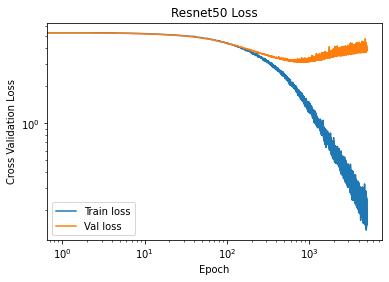

In [22]:
plt.loglog()
plt.plot(train_losses)
plt.plot(val_losses)
plt.title("Resnet50 Loss")
plt.xlabel("Epoch")
plt.ylabel("Cross Validation Loss")
plt.legend(["Train loss", "Val loss"])

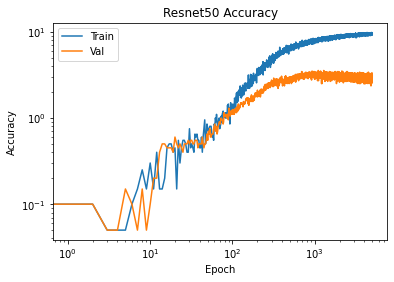

In [79]:
plt.loglog()
plt.plot(train_accs)
plt.plot(val_accs)
plt.title("Resnet50 Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend(["Train", "Val"])

# Inference

## Create dataset for test

In [20]:
# ====================================================
# Dataset for test
# ====================================================

mean = np.array([0.37087523, 0.370876, 0.3708759] )
std = np.array([0.21022698, 0.21022713, 0.21022706])

class IWildcamTestDataset(Dataset):
    def __init__(self, df, tfms=None):
        self.ids = df["id"]
        self.idx = df["idx"]
        self.tfms = tfms
        
    def __len__(self):
        return len(self.ids)
    
    def __getitem__(self, idx):
        size = (256, 256)
        image_id = self.ids[idx]
        image_idx = self.idx[idx]
        
        image_path = os.path.join(TEST_CROPED_DATA, f"{image_id}_{image_idx}.jpg")
        
        img = cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB),size)

        if self.tfms is not None:
            augmented = self.tfms(image=img)
            img = augmented['image']
            
        # we should normalize here
        return img2tensor((img/255.0 - mean)/std), image_id

In [21]:
ds_test = IWildcamTestDataset(df_croped_img_ids_test)
dl_test = DataLoader(ds_test,batch_size=32,shuffle=False,num_workers=NUM_WORKERS)

## Load trained model

In [23]:
model = rnet(backbone="resnet50", out_dim=205)
model.to(DEVICE)
model.load_state_dict(torch.load(f"{1000}_.pth"))
model.eval()

rnet(
  (rnet): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act1): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act1): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act2): ReLU(inplace=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act3):

## inference

In [24]:
pred_categories = []
pred_img_ids = []
pred_raw_outputs = []

In [25]:
with torch.no_grad():
    for imgs, img_ids in tqdm(dl_test):
        imgs = imgs.to(DEVICE)
        
        outputs = model(imgs)
        output_labels = torch.argmax(outputs, dim=1).tolist()
        pred_raw_outputs += outputs.tolist()
        pred_categories += output_labels
        pred_img_ids += img_ids

100%|██████████████████████████████████████| 1008/1008 [15:58<00:00,  1.05it/s]


In [26]:
pred = collections.defaultdict(list)
pred_values = collections.defaultdict(list)

for category, img_id in zip(pred_categories, pred_img_ids):
    pred[img_id].append(category)
    
for values, img_id in zip(pred_raw_outputs, pred_img_ids):
    pred_values[img_id].append(values)

In [27]:
pred

defaultdict(list,
            {'915879a0-21bc-11ea-a13a-137349068a90': [56],
             '91588116-21bc-11ea-a13a-137349068a90': [32],
             '9158a2f4-21bc-11ea-a13a-137349068a90': [198],
             '9158aaa6-21bc-11ea-a13a-137349068a90': [56],
             '9158f1a0-21bc-11ea-a13a-137349068a90': [57],
             '9159244a-21bc-11ea-a13a-137349068a90': [11],
             '91599f88-21bc-11ea-a13a-137349068a90': [4],
             '915a05ea-21bc-11ea-a13a-137349068a90': [66],
             '915a0cde-21bc-11ea-a13a-137349068a90': [87,
              87,
              201,
              201,
              201,
              72],
             '915a41b8-21bc-11ea-a13a-137349068a90': [99, 87, 50],
             '915a9f14-21bc-11ea-a13a-137349068a90': [66],
             '915aa658-21bc-11ea-a13a-137349068a90': [1],
             '915ad13c-21bc-11ea-a13a-137349068a90': [56],
             '915ad448-21bc-11ea-a13a-137349068a90': [99],
             '915b3d3e-21bc-11ea-a13a-137349068a90': [66

In [28]:
pred_values

defaultdict(list,
            {'915879a0-21bc-11ea-a13a-137349068a90': [[5.128627777099609,
               0.8814876675605774,
               4.664633750915527,
               -2.869809150695801,
               3.04767107963562,
               -2.9119489192962646,
               -3.876723527908325,
               -4.524981498718262,
               -2.605764389038086,
               5.005116939544678,
               -1.5749032497406006,
               0.24921634793281555,
               -0.9319531917572021,
               -3.7232182025909424,
               -0.26552754640579224,
               -3.0366899967193604,
               3.227980852127075,
               4.469167232513428,
               -0.20533126592636108,
               -1.483359694480896,
               3.3473355770111084,
               -2.7955780029296875,
               3.5452077388763428,
               3.8642547130584717,
               -2.069352388381958,
               -3.3309266567230225,
               -2.723014354

In [29]:
with open(os.path.join(DATASET, 'metadata/iwildcam2021_test_information.json'), encoding='utf-8') as json_file:
    test_information =json.load(json_file)
    
with open(os.path.join(DATASET, 'metadata/iwildcam2021_test_information.json'), encoding='utf-8') as json_file:
    test_information =json.load(json_file)
    
df_test_info = pd.DataFrame(test_information["images"])[["id", "seq_id"]]

In [30]:
df_test_info.head()

,id,seq_id
0,8b31d3be-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
1,8cf202be-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
2,8a87e62e-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
3,8e6994f4-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
4,948b29e2-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002


In [34]:
with open(os.path.join(DATASET, "metadata\\iwildcam2021_megadetector_results.json")) as f:
    megadetector = json.load(f)
print(megadetector["info"])
print(megadetector["detection_categories"])

{'format_version': '1.0', 'detector': 'megadetector_v3', 'detection_completion_time': '2020-01-10 08:49:05'}
{'2': 'person', '1': 'animal'}


In [133]:
boxes = collections.defaultdict(list)

for category, img_id in zip(pred_categories, pred_img_ids):
    pred[img_id].append(category)
for s in megadetector["images"]:
    for det in s["detections"]:
        if det["conf"] > .9:
            boxes[s["id"]].append(det['bbox'])

seqs = np.array(sub["Id"])

In [134]:
print(seqs[:10])

['32ce8026-7ec9-11eb-b675-4f3cc0c82eb3'
 '945c6602-21bc-11ea-a13a-137349068a90'
 'a91c7e26-0cd3-11eb-bed1-0242ac1c0002'
 '9926239e-21bc-11ea-a13a-137349068a90'
 '9672184c-21bc-11ea-a13a-137349068a90'
 'a91764b8-0cd3-11eb-bed1-0242ac1c0002'
 'a91bb310-0cd3-11eb-bed1-0242ac1c0002'
 '947e14e6-21bc-11ea-a13a-137349068a90'
 'a921b56c-0cd3-11eb-bed1-0242ac1c0002'
 '3869411a-6fe2-11eb-844f-0242ac1c0002']


In [33]:
print(boxes["945336fe-21bc-11ea-a13a-137349068a90"])
for c in megadetector["images"]:
    if c["id"] == "945336fe-21bc-11ea-a13a-137349068a90":
        print(c)
        break

[]
{'detections': [{'category': '1', 'bbox': [0.5515, 0.4134, 0.036, 0.0598], 'conf': 0.754}, {'category': '1', 'bbox': [0.5549, 0.4148, 0.0308, 0.0376], 'conf': 0.477}, {'category': '1', 'bbox': [0.5449, 0.4125, 0.0436, 0.0855], 'conf': 0.349}], 'id': '945336fe-21bc-11ea-a13a-137349068a90', 'max_detection_conf': 0.754}


Seq 38, count: 2
canis latrans
canis latrans


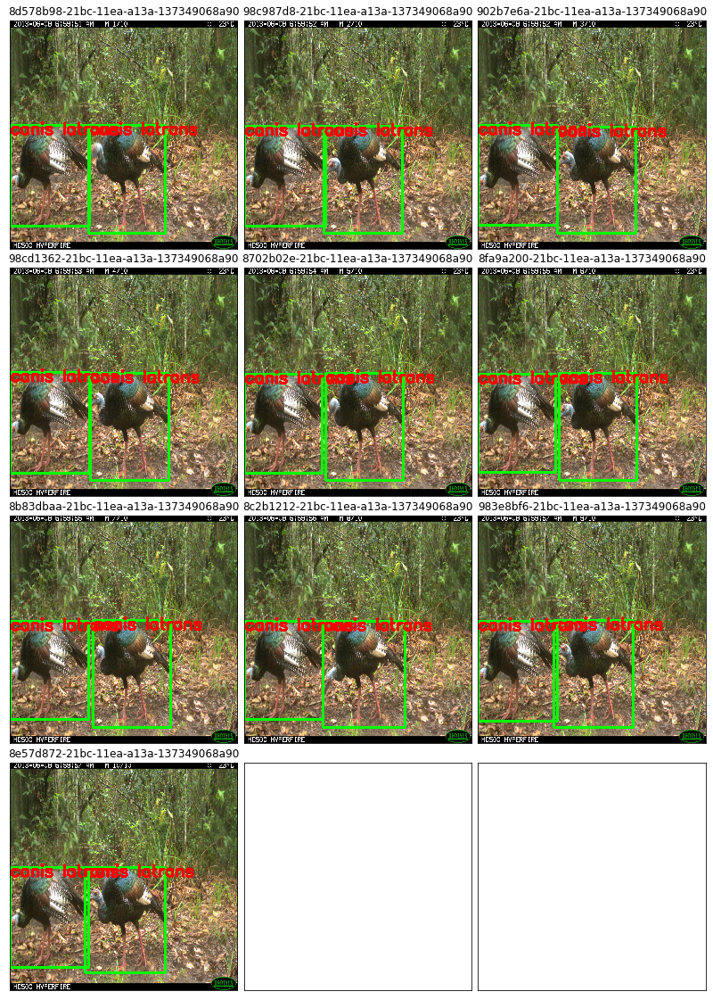

In [139]:
# Show Untracked
show = [38]
im_ids = []
tot_imgs = 0
ims_pre_row = 3
match_thresh = .08
dist_thresh = .2
    
for seq_id in show:
    im_ids.append(np.array(df_test_info[df_test_info["seq_id"] == seqs[seq_id]]["id"]))
    tot_imgs += len(im_ids[-1])
    
fig = plt.figure(figsize=(20., int(tot_imgs/ims_pre_row + 1) * 5.))
grid = ImageGrid(fig, 111,  
                 nrows_ncols=(int(tot_imgs/ims_pre_row + 1), ims_pre_row),  
                 axes_pad=(0.1, .3))

size = (256, 256)
#im_ids[0].sort()
curr_ax = 0

for i, seq in enumerate(show):
    unique_animals = [] # [id, normed(last_pred_value), normed(last_xy), cumulative_pred_value, seen_count]
    seq_im_ids = im_ids[i]
    for im in seq_im_ids:
        all_preds = np.array(pred_values[im])
        for pred_value, box in zip(all_preds, boxes[im]):
            pred_value = pred_value / np.linalg.norm(pred_value)
            found = False
            xy = np.array(box[0:2])
            for j, last_pred_value, last_xy, cum_pred_value, seen_count in unique_animals:
                if np.linalg.norm(last_pred_value * pred_value) > match_thresh and np.linalg.norm(xy - last_xy) < dist_thresh:
                    unique_animals[j] = [j, pred_value, xy, cum_pred_value + pred_value, seen_count + 1]
                    found = True
                    break
            if found == False:
                unique_animals.append([len(unique_animals), pred_value, xy, pred_value, 1])
                
    for im in seq_im_ids:
        # Iterating over the grid returns the Axes.
        ax = grid[curr_ax]
        curr_ax += 1
        bboxes = boxes[im]
        ax.set_title(im)
        image_path = os.path.join(DATASET, "test", im+".jpg")
        img = cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB), size)
        for j, box in enumerate(bboxes):
            #print(i, len(pred[im]), image_name)
            box_label = pred[im][j]
            xy = (np.array(box[0:2]) * [len(img), len(img[0])]).astype(int)
            wh = (np.array(box[2:4]) * [len(img), len(img[0])]).astype(int)
            xy = (np.array(box[0:2]) * size).astype(int)
            wh = (np.array(box[2:4]) * size).astype(int)
            cv2.rectangle(img, tuple(xy), tuple(xy + wh), (0, 255, 0), 2)
            cv2.putText(img, class_names[class_ids[box_label]], tuple(xy+[0, 10]), cv2.FONT_HERSHEY_SIMPLEX, .6, (255, 0, 0), 2)
        ax.get_yaxis().set_ticks([])
        ax.get_xaxis().set_ticks([])
        ax.imshow(img)
    
    print(f"Seq {seq}, count: {len(unique_animals)}")
    for unique_animal in unique_animals:
        print(class_names[class_ids[np.argmax(unique_animal[3])]])
        
    seq_im_ids = im_ids[i]
    

plt.savefig("not_tracking4.png")
plt.show()

Seq 37, count: 2
puma concolor
puma concolor
tinamus major
tinamus major


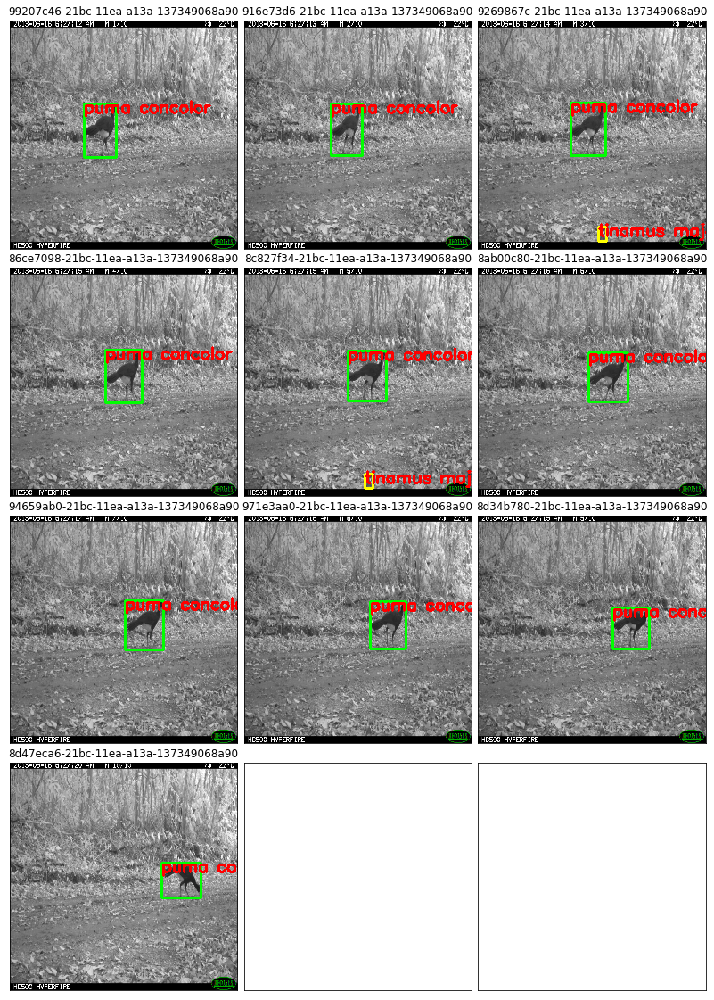

In [129]:
# Show Tracked
show = [37] # 17, 36-38
im_ids = []
tot_imgs = 0
ims_pre_row = 3
match_thresh = .08
dist_thresh = .2
colors = [(0, 255, 0), (255, 255, 0), (0, 255, 255)]
    
for seq_id in show:
    im_ids.append(np.array(df_test_info[df_test_info["seq_id"] == seqs[seq_id]]["id"]))
    tot_imgs += len(im_ids[-1])
    
fig = plt.figure(figsize=(20., int(tot_imgs/ims_pre_row + 1) * 5.))
grid = ImageGrid(fig, 111,  
                 nrows_ncols=(int(tot_imgs/ims_pre_row + 1), ims_pre_row),  
                 axes_pad=(0.1, .3))

size = (256, 256)
#im_ids[0].sort()
curr_ax = 0

for i, seq in enumerate(show):
    unique_animals = [] # [id, normed(last_pred_value), normed(last_xy), cumulative_pred_value, seen_count]
    seq_im_ids = im_ids[i]
    show_info = []
    for im in seq_im_ids:
        show_info.append([])
        all_preds = np.array(pred_values[im])
        for pred_value, box in zip(all_preds, boxes[im]):
            pred_value = pred_value / np.linalg.norm(pred_value)
            found = False
            xy = np.array(box[0:2])
            wh = np.array(box[2:4])
            for j, last_pred_value, last_xy, cum_pred_value, seen_count in unique_animals:
                if np.linalg.norm(last_pred_value * pred_value) > match_thresh and np.linalg.norm(xy - last_xy) < dist_thresh:
                    unique_animals[j] = [j, pred_value, xy, cum_pred_value + pred_value, seen_count + 1]
                    show_info[-1].append([j, xy, wh, (xy - last_xy)])
                    found = True
                    break
            if found == False:
                unique_animals.append([len(unique_animals), pred_value, xy, pred_value, 1])
                show_info[-1].append([len(unique_animals)-1, xy, wh, None])
    
    
    id_to_name = [(cum_pred_value.argsort()[-1]) for j, last_pred_value, last_xy, cum_pred_value, seen_count in unique_animals]
    for im, infos in zip(seq_im_ids, show_info):
        #print(df_train_annotation[df_train_annotation["image_id"] == im])
        #print(im)
        # Iterating over the grid returns the Axes.
        ax = grid[curr_ax]
        curr_ax += 1
        bboxes = boxes[im]
        ax.set_title(im)
        image_path = os.path.join(DATASET, "test", im+".jpg")
        img = cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB), size)
        for j, info in enumerate(infos):
            #print(i, len(pred[im]), image_name)
            box_label = id_to_name[info[0]]
            xy = (info[1] * size).astype(int)
            wh = (info[2] * size).astype(int)
            cv2.rectangle(img, tuple(xy), tuple(xy + wh), colors[info[0]], 2)
            cv2.putText(img, class_names[class_ids[box_label]], tuple(xy+[0, 10]), cv2.FONT_HERSHEY_SIMPLEX, .6, (255, 0, 0), 2)
        ax.get_yaxis().set_ticks([])
        ax.get_xaxis().set_ticks([])
        ax.imshow(img)
    
    print(f"Seq {seq}, count: {len(unique_animals)}")
    for unique_animal in unique_animals:
        print(class_names[class_ids[np.argmax(unique_animal[3])]])
        print(class_names[class_ids[np.argmax(unique_animal[3])]])
        
    seq_im_ids = im_ids[i]
    

#plt.savefig("tracking4.png")
plt.show()

# Evaluate tracking

In [28]:
class IWildcamEvalTrackDataset(Dataset):
    def __init__(self, df, tfms=None):
        self.ids = df["id"]
        self.idx = df["idx"]
        self.tfms = tfms
        
    def __len__(self):
        return len(self.ids)
    
    def __getitem__(self, idx):
        size = (256, 256)
        image_id = self.ids[idx]
        image_idx = self.idx[idx]
        
        image_path = os.path.join(TRAIN_CROPED_DATA, f"{image_id}_{image_idx}.jpg")
        
        img = cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB),size)

        if self.tfms is not None:
            augmented = self.tfms(image=img)
            img = augmented['image']
            
        # we should normalize here
        return img2tensor((img/255.0 - mean)/std), image_id

In [29]:
seq2counts = {'301d266c-7d42-11eb-8fb5-0242ac1c0002': 7, '5c9d8c06-7ed0-11eb-b7d6-0242ac1c0002': 7, '3027f1a0-7d42-11eb-8fb5-0242ac1c0002': 12, '2fff04a2-7d42-11eb-8fb5-0242ac1c0002': 8, '30274084-7d42-11eb-8fb5-0242ac1c0002': 18, '302808f2-7d42-11eb-8fb5-0242ac1c0002': 11}
relevant_ims = []
for seq in seq2counts.keys():
    for im in seq2im[seq]:
        relevant_ims.append(im)

In [30]:
print(df_croped_img_ids_test)

                                         id  idx
0      915879a0-21bc-11ea-a13a-137349068a90    1
1      91588116-21bc-11ea-a13a-137349068a90    1
2      9158a2f4-21bc-11ea-a13a-137349068a90    1
3      9158aaa6-21bc-11ea-a13a-137349068a90    1
4      9158f1a0-21bc-11ea-a13a-137349068a90    1
...                                     ...  ...
32251  883c9090-21bc-11ea-a13a-137349068a90    1
32252  883c945a-21bc-11ea-a13a-137349068a90    1
32253  883cda5a-21bc-11ea-a13a-137349068a90    1
32254  883ceeaa-21bc-11ea-a13a-137349068a90    1
32255  883d13bc-21bc-11ea-a13a-137349068a90    1

[32256 rows x 2 columns]


In [31]:
relevant_img_ids = df_croped_img_ids_train[pd.DataFrame(df_croped_img_ids_train.id.tolist()).isin(relevant_ims).any(1).values][["id", "idx"]].reset_index()
ds_evaltrack = IWildcamEvalTrackDataset(relevant_img_ids)
dl_evaltrack = DataLoader(ds_evaltrack,batch_size=10,shuffle=False,num_workers=NUM_WORKERS)

In [26]:
print(relevant_img_ids)

      index                                    id  idx
0      4827  96251d1c-21bc-11ea-a13a-137349068a90    1
1      4828  96251d1c-21bc-11ea-a13a-137349068a90    2
2      4829  96251d1c-21bc-11ea-a13a-137349068a90    3
3      4830  96251d1c-21bc-11ea-a13a-137349068a90    4
4      5055  944dd060-21bc-11ea-a13a-137349068a90    1
..      ...                                   ...  ...
272  172229  8ead6e9a-21bc-11ea-a13a-137349068a90    5
273  172230  8ead6e9a-21bc-11ea-a13a-137349068a90    6
274  172231  8ead6e9a-21bc-11ea-a13a-137349068a90    7
275  172232  8ead6e9a-21bc-11ea-a13a-137349068a90    8
276  172233  8ead6e9a-21bc-11ea-a13a-137349068a90    9

[277 rows x 3 columns]


In [27]:
model = rnet(backbone="resnet50", out_dim=205)
model.to(DEVICE)
model.load_state_dict(torch.load(f"resnet50_scaled/{1000}_.pth"))
model.eval()

pred_categories = []
pred_img_ids = []
pred_raw_outputs = []

with torch.no_grad():
    for imgs, img_ids in tqdm(dl_evaltrack):
        imgs = imgs.to(DEVICE)
        
        outputs = model(imgs)
        output_labels = torch.argmax(outputs, dim=1).tolist()
        pred_raw_outputs += outputs.tolist()
        pred_categories += output_labels
        pred_img_ids += img_ids

pred = collections.defaultdict(list)
pred_values = collections.defaultdict(list)

for category, img_id in zip(pred_categories, pred_img_ids):
    pred[img_id].append(category)
    
for values, img_id in zip(pred_raw_outputs, pred_img_ids):
    pred_values[img_id].append(values)

  0%|                                                   | 0/28 [00:00<?, ?it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\96251d1c-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96251d1c-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96251d1c-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96251d1c-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\944dd060-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\944dd060-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\944dd060-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\944dd060-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\944dd060-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91725d8e-21bc-11ea-a13a-137349068a90_1.jpg


  4%|█▌                                         | 1/28 [00:01<00:52,  1.94s/it]

D:\Data\wildcamdata\256x256\cropped_images_train\91725d8e-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91725d8e-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91725d8e-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91725d8e-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91725d8e-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91725d8e-21bc-11ea-a13a-137349068a90_7.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91725d8e-21bc-11ea-a13a-137349068a90_8.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91725d8e-21bc-11ea-a13a-137349068a90_9.jpg

  7%|███                                        | 2/28 [00:02<00:26,  1.02s/it]


D:\Data\wildcamdata\256x256\cropped_images_train\918337a8-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\918337a8-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\918337a8-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\918337a8-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\918337a8-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\918337a8-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\90dfeeea-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\90dfeeea-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\90dfeeea-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\90dfeeea-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\90dfeeea-21bc-11ea-a13a-137349

 11%|████▌                                      | 3/28 [00:02<00:19,  1.30it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\9019a55a-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9019a55a-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9019a55a-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9019a55a-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9019a55a-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9027bbf4-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9027bbf4-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9027bbf4-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9027bbf4-21bc-11ea-a13a-137349068a90_4.jpg


 14%|██████▏                                    | 4/28 [00:03<00:14,  1.63it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\9027bbf4-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9027bbf4-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9027bbf4-21bc-11ea-a13a-137349068a90_7.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\973e1802-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\973e1802-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\973e1802-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\973e1802-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\973e1802-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8dc7ea64-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8dc7ea64-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8dc7ea64-21bc-11ea-a13a-1373490

 18%|███████▋                                   | 5/28 [00:03<00:12,  1.88it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\8dc7ea64-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8dc7ea64-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8dd2ba66-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8dd2ba66-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8dd2ba66-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8dd2ba66-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8dd2ba66-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8dd3cfc8-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8dd3cfc8-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8dd3cfc8-21bc-11ea-a13a-137349068a90_3.jpg


 21%|█████████▏                                 | 6/28 [00:03<00:10,  2.05it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\8dd3cfc8-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8dd3cfc8-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8dd3cfc8-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8ddbc23c-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8ddbc23c-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8ddbc23c-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8ddbc23c-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8ddbc23c-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\94af09e8-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\94af09e8-21bc-11ea-a13a-137349068a90_2.jpg


 25%|██████████▊                                | 7/28 [00:04<00:09,  2.18it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\94af09e8-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\94af09e8-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\94af09e8-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\94af09e8-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\94af09e8-21bc-11ea-a13a-137349068a90_7.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\89c85692-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\89c85692-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\89c85692-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\89c85692-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\89c85692-21bc-11ea-a13a-137349068a90_5.jpg


 29%|████████████▎                              | 8/28 [00:04<00:09,  2.21it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\89c85692-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\89c85692-21bc-11ea-a13a-137349068a90_7.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\89c85692-21bc-11ea-a13a-137349068a90_8.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\89c85692-21bc-11ea-a13a-137349068a90_9.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\903dd272-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\903dd272-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\903dd272-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\903dd272-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\903dd272-21bc-11ea-a13a-137349068a90_5.jpg

 32%|█████████████▊                             | 9/28 [00:05<00:08,  2.34it/s]


D:\Data\wildcamdata\256x256\cropped_images_train\98843336-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\98843336-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\98843336-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\98843336-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\98843336-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9914095c-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9914095c-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9914095c-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9914095c-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9914095c-21bc-11ea-a13a-137349068a90_5.jpg

 36%|███████████████                           | 10/28 [00:05<00:07,  2.41it/s]


D:\Data\wildcamdata\256x256\cropped_images_train\99438b50-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\99438b50-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\899b0052-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\899b0052-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\899b0052-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\899b0052-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\899b0052-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\899b0052-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\899b0052-21bc-11ea-a13a-137349068a90_7.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\899b0052-21bc-11ea-a13a-137349068a90_8.jpg


 39%|████████████████▌                         | 11/28 [00:06<00:07,  2.33it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\899b0052-21bc-11ea-a13a-137349068a90_9.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9113ddf4-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9113ddf4-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\885c600a-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\885c600a-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\885c600a-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\885c600a-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\885c600a-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\885c600a-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8cfce2ba-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8cfce2ba-21bc-11ea-a13a-1373490

 43%|██████████████████                        | 12/28 [00:06<00:06,  2.42it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\8cfce2ba-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8cfce2ba-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8cfce2ba-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8a5a5f06-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8a5a5f06-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9526ecb0-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9526ecb0-21bc-11ea-a13a-137349068a90_2.jpg


 46%|███████████████████▌                      | 13/28 [00:06<00:06,  2.44it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\9526ecb0-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9526ecb0-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9526ecb0-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9526ecb0-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9526ecb0-21bc-11ea-a13a-137349068a90_7.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9526ecb0-21bc-11ea-a13a-137349068a90_8.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9526ecb0-21bc-11ea-a13a-137349068a90_9.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9526ecb0-21bc-11ea-a13a-137349068a90_10.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9526ecb0-21bc-11ea-a13a-137349068a90_11.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\952a3c80-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\952a3c80-21bc-11ea-a13a-13734

 50%|█████████████████████                     | 14/28 [00:07<00:05,  2.39it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\952a3c80-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8f0fbf8c-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8f0fbf8c-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8f0fbf8c-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8f0fbf8c-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8f0fbf8c-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9277dc9a-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9277dc9a-21bc-11ea-a13a-137349068a90_2.jpg


 54%|██████████████████████▌                   | 15/28 [00:07<00:05,  2.49it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\94f186ce-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\94f186ce-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\94f186ce-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\94f186ce-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\94f186ce-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e3e8d0e-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e3e8d0e-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e3e8d0e-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e3e8d0e-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e3e8d0e-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e25e11e-21bc-11ea-a13a-1373490

 57%|████████████████████████                  | 16/28 [00:08<00:04,  2.43it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\8e25e11e-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e25e11e-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e25e11e-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e25e11e-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e25e11e-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e2b43ca-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e2b43ca-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e2b43ca-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e2b43ca-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e2b43ca-21bc-11ea-a13a-137349068a90_5.jpg


 61%|█████████████████████████▍                | 17/28 [00:08<00:04,  2.43it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\8e2b43ca-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e2b43ca-21bc-11ea-a13a-137349068a90_7.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8e2b43ca-21bc-11ea-a13a-137349068a90_8.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\922cc6c4-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\922cc6c4-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\922cc6c4-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\922cc6c4-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\922cc6c4-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\92309ac4-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\92309ac4-21bc-11ea-a13a-137349068a90_2.jpg

 64%|███████████████████████████               | 18/28 [00:08<00:03,  2.52it/s]


D:\Data\wildcamdata\256x256\cropped_images_train\937b59c8-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\937b59c8-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\937b59c8-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\937b59c8-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\937b59c8-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91f0791c-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91f0791c-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91f0791c-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91f0791c-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91f0791c-21bc-11ea-a13a-137349068a90_5.jpg

 68%|████████████████████████████▌             | 19/28 [00:09<00:03,  2.52it/s]


D:\Data\wildcamdata\256x256\cropped_images_train\91fbdaa0-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91fbdaa0-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91fbdaa0-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\91fbdaa0-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9204d4ca-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9204d4ca-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\955e554c-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\955e554c-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\955e554c-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\955e554c-21bc-11ea-a13a-137349068a90_4.jpg

 71%|██████████████████████████████            | 20/28 [00:09<00:03,  2.54it/s]


D:\Data\wildcamdata\256x256\cropped_images_train\955e554c-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\955e554c-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9562e5da-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9562e5da-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9562e5da-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9562e5da-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\9562e5da-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\939b07aa-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\939b07aa-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\939b07aa-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\939b07aa-21bc-11ea-a13a-137349

 75%|███████████████████████████████▌          | 21/28 [00:10<00:03,  2.26it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\939b07aa-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\939b07aa-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\939b07aa-21bc-11ea-a13a-137349068a90_7.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\939b07aa-21bc-11ea-a13a-137349068a90_8.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\939b07aa-21bc-11ea-a13a-137349068a90_9.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\93b673dc-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\93b673dc-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\93b673dc-21bc-11ea-a13a-137349068a90_3.jpg

 79%|█████████████████████████████████         | 22/28 [00:10<00:02,  2.40it/s]


D:\Data\wildcamdata\256x256\cropped_images_train\93b673dc-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\93b673dc-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\92a36ce8-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\92a36ce8-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\87e02a8a-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\87e02a8a-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\87e02a8a-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\87e02a8a-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\87e02a8a-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\87e02a8a-21bc-11ea-a13a-137349068a90_6.jpg


 82%|██████████████████████████████████▌       | 23/28 [00:10<00:02,  2.47it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\87e02a8a-21bc-11ea-a13a-137349068a90_7.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\90c600d4-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\90c600d4-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\90c600d4-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\90c600d4-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\90c600d4-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8705c07a-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8705c07a-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8705c07a-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8f987ae8-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8f987ae8-21bc-11ea-a13a-1373490

 86%|████████████████████████████████████      | 24/28 [00:11<00:01,  2.39it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\969071f2-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\969071f2-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\969071f2-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\969071f2-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96a1e4fa-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96a1e4fa-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96a1e4fa-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96a1e4fa-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96a1e4fa-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\98f941c6-21bc-11ea-a13a-137349068a90_1.jpg


 89%|█████████████████████████████████████▌    | 25/28 [00:11<00:01,  2.40it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\98f941c6-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\98f941c6-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\98f941c6-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\98f941c6-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\98f941c6-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\98f941c6-21bc-11ea-a13a-137349068a90_7.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\98f941c6-21bc-11ea-a13a-137349068a90_8.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\98f941c6-21bc-11ea-a13a-137349068a90_9.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8c4e7aea-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8c4e7aea-21bc-11ea-a13a-137349068a90_2.jpg


 93%|███████████████████████████████████████   | 26/28 [00:12<00:00,  2.38it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\8c4e7aea-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8c4e7aea-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96b2a664-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96b2a664-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96b2a664-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96b2a664-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96b2a664-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96b2a664-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\96b2a664-21bc-11ea-a13a-137349068a90_7.jpg


 96%|████████████████████████████████████████▌ | 27/28 [00:12<00:00,  2.32it/s]

D:\Data\wildcamdata\256x256\cropped_images_train\8ead6e9a-21bc-11ea-a13a-137349068a90_1.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8ead6e9a-21bc-11ea-a13a-137349068a90_2.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8ead6e9a-21bc-11ea-a13a-137349068a90_3.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8ead6e9a-21bc-11ea-a13a-137349068a90_4.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8ead6e9a-21bc-11ea-a13a-137349068a90_5.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8ead6e9a-21bc-11ea-a13a-137349068a90_6.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8ead6e9a-21bc-11ea-a13a-137349068a90_7.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8ead6e9a-21bc-11ea-a13a-137349068a90_8.jpg
D:\Data\wildcamdata\256x256\cropped_images_train\8ead6e9a-21bc-11ea-a13a-137349068a90_9.jpg

100%|██████████████████████████████████████████| 28/28 [00:12<00:00,  2.16it/s]

In [36]:
boxes = collections.defaultdict(list)

for category, img_id in zip(pred_categories, pred_img_ids):
    pred[img_id].append(category)
for s in megadetector["images"]:
    for det in s["detections"]:
        if det["conf"] > .9:
            boxes[s["id"]].append(det['bbox'])

error: OpenCV(3.4.2) c:\miniconda3\conda-bld\opencv-suite_1534379934306\work\modules\imgproc\src\color.hpp:253: error: (-215:Assertion failed) VScn::contains(scn) && VDcn::contains(dcn) && VDepth::contains(depth) in function 'cv::CvtHelper<struct cv::Set<3,4,-1>,struct cv::Set<3,4,-1>,struct cv::Set<0,2,5>,2>::CvtHelper'


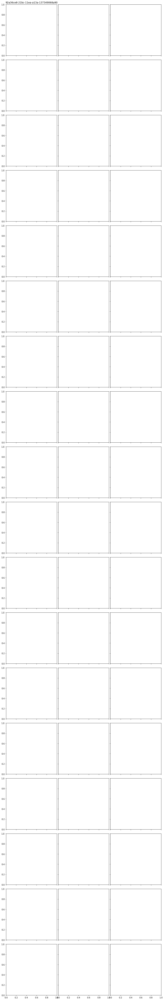

In [37]:
# Show Tracked
show = seq2counts.keys()
im_ids = []
tot_imgs = 0
ims_pre_row = 3
match_thresh = .08
dist_thresh = .2
colors = [(0, 255, 0), (255, 255, 0), (0, 255, 255), (0, 100, 255), (100, 255, 255), (0, 255, 100), (100, 100, 100)]
    
for seq_id in show:
    tot_imgs += len(seq2im[seq_id])
    
fig = plt.figure(figsize=(20., int(tot_imgs/ims_pre_row + 1) * 5.))
grid = ImageGrid(fig, 111,  
                 nrows_ncols=(int(tot_imgs/ims_pre_row + 1), ims_pre_row),  
                 axes_pad=(0.1, .3))

size = (256, 256)
#im_ids[0].sort()
curr_ax = 0

for i, seq in enumerate(show):
    unique_animals = [] # [id, normed(last_pred_value), normed(last_xy), cumulative_pred_value, seen_count]
    seq_im_ids = seq2im[seq]
    show_info = []
    for im in seq_im_ids:
        show_info.append([])
        all_preds = np.array(pred_values[im])
        for pred_value, box in zip(all_preds, boxes[im]):
            pred_value = pred_value / np.linalg.norm(pred_value)
            found = False
            xy = np.array(box[0:2])
            wh = np.array(box[2:4])
            for j, last_pred_value, last_xy, cum_pred_value, seen_count in unique_animals:
                if np.linalg.norm(last_pred_value * pred_value) > match_thresh and np.linalg.norm(xy - last_xy) < dist_thresh:
                    unique_animals[j] = [j, pred_value, xy, cum_pred_value + pred_value, seen_count + 1]
                    show_info[-1].append([j, xy, wh, (xy - last_xy)])
                    found = True
                    break
            if found == False:
                unique_animals.append([len(unique_animals), pred_value, xy, pred_value, 1])
                show_info[-1].append([len(unique_animals)-1, xy, wh, None])
    
    
    id_to_name = [(cum_pred_value.argsort()[-1]) for j, last_pred_value, last_xy, cum_pred_value, seen_count in unique_animals]
    for im, infos in zip(seq_im_ids, show_info):
        # Iterating over the grid returns the Axes.
        ax = grid[curr_ax]
        curr_ax += 1
        bboxes = boxes[im]
        ax.set_title(im)
        image_path = os.path.join(DATASET, "test", im+".jpg")
        img = cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB), size)
        for j, info in enumerate(infos):
            #print(i, len(pred[im]), image_name)
            box_label = id_to_name[info[0]]
            xy = (info[1] * size).astype(int)
            wh = (info[2] * size).astype(int)
            cv2.rectangle(img, tuple(xy), tuple(xy + wh), colors[info[0]], 2)
            cv2.putText(img, class_names[class_ids[box_label]], tuple(xy+[0, 10]), cv2.FONT_HERSHEY_SIMPLEX, .6, (255, 0, 0), 2)
        ax.get_yaxis().set_ticks([])
        ax.get_xaxis().set_ticks([])
        ax.imshow(img)
    
    print(f"Seq {seq}, count: {len(unique_animals)}")
    for unique_animal in unique_animals:
        print(class_names[class_ids[np.argmax(unique_animal[3])]])
        print(class_names[class_ids[np.argmax(unique_animal[3])]])
        
    seq_im_ids = im_ids[i]
    

#plt.savefig("tracking4.png")
plt.show()

In [ ]:
track = df_croped_img_ids_train[["id", "idx"]].merge(df_train_annotation[["image_id", "category_id"]], 
                                      left_on='id', right_on='image_id')[["id", "idx", "category_id"]]
ds_test = IWildcamTestDataset(track)
dl_test = DataLoader(ds_test,batch_size=32,shuffle=False,num_workers=NUM_WORKERS)
for seq in seq2counts.keys():
    seq2im[seq]

# Create submit file

In [87]:
sub = pd.read_csv(os.path.join(DATASET, 'sample_submission.csv'))
col_Predicted = [col for col in sub.columns if "Predicted" in col]

In [88]:
sub = pd.read_csv(os.path.join(DATASET, 'sample_submission.csv'))
# zero everything
for col in sub.columns[1:]:
    sub[col] = 0
    #print(col, np.sum(np.array(sub[col]).astype("float")))

In [89]:
with open(os.path.join(DATASET, 'metadata/iwildcam2021_train_annotations.json'), encoding='utf-8') as json_file:
    train_annotations =json.load(json_file)
df_categories = pd.DataFrame.from_records(train_annotations["categories"])

In [90]:
im_ids = []
tot_imgs = 0
    
for seq_id in tqdm(seqs):
    #print(seq_id)
    #print(df_test_info[df_test_info["seq_id"] == seq_id]["id"])
    im_ids.append(np.array(df_test_info[df_test_info["seq_id"] == seq_id]["id"]))
    tot_imgs += len(im_ids[-1])

100%|███████████████████████████████████| 11057/11057 [01:02<00:00, 176.23it/s]


In [82]:
sub

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted559,Predicted562,Predicted563,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571
0,32ce8026-7ec9-11eb-b675-4f3cc0c82eb3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,945c6602-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,a91c7e26-0cd3-11eb-bed1-0242ac1c0002,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9926239e-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9672184c-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11052,96aedea8-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11053,98bf9b2e-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11054,3867ac88-6fe2-11eb-844f-0242ac1c0002,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11055,940f8f6c-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [91]:
match_thresh = .08
dist_thresh = .2

counts = np.zeros((len(sub), 205))
#sub.set_index(['id'])
for i, seq in tqdm(enumerate(seqs)):
    unique_animals = [] # [id, normed(last_pred_value), normed(last_xy), cumulative_pred_value, seen_count]
    seq_im_ids = im_ids[i]
    for im in seq_im_ids:
        all_preds = np.array(pred_values[im])
        for pred_value, box in zip(all_preds, boxes[im]):
            pred_value = pred_value / np.linalg.norm(pred_value)
            found = False
            xy = np.array(box[0:2])
            for j, last_pred_value, last_xy, cum_pred_value, seen_count in unique_animals:
                if np.linalg.norm(last_pred_value * pred_value) > match_thresh and np.linalg.norm(xy - last_xy) < dist_thresh:
                    unique_animals[j] = [j, pred_value, xy, cum_pred_value + pred_value, seen_count + 1]
                    found = True
                    break
            if found == False:
                unique_animals.append([len(unique_animals), pred_value, xy, pred_value, 1])
    #row = sub[sub["Id"] == seq].index
    #print(row)
    for unique_animal in unique_animals:
        #print(unique_animal[-2])
        #print(np.array(unique_animal[-2]).argsort())
        #rint(sub.iloc[row].iloc[np.array(unique_animal[-2]).argsort()[-1]])
        counts[i, np.array(unique_animal[-2]).argsort()[-1]] += 1
        
columns = sub.columns
for column in range(1, 205):
    sub[columns[column]] = counts[:, column]

11057it [00:02, 4568.48it/s]


For each image, count the number of each animal species and store them in the corresponding column.

In [35]:
results = []

for key in pred.keys():
    c = collections.Counter(pred[key])
    
    res = []
    cnts = [ 0 for i in range(205)]
    for category, cnt in c.items():
        cnts[category] = cnt
    res += [key] + cnts[1:]
    results.append(res)

Convert to pandas dataframe.

In [36]:
sub_tmp = pd.DataFrame(results, columns=sub.columns)

In [37]:
sub_tmp.head()

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted559,Predicted562,Predicted563,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571
0,915879a0-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,91588116-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,9158a2f4-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9158aaa6-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9158f1a0-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
sub_tmp.to_csv("./sub_tmp.csv", index=False)

Add seq_id information to the counted results. iwildcam2021_test_information.json contains the mapping between the id of the image and the id of the sequence.

In [62]:
sub_tmp = pd.read_csv('./sub_tmp.csv')
with open(os.path.join(DATASET, 'metadata/iwildcam2021_test_information.json'), encoding='utf-8') as json_file:
    test_information =json.load(json_file)
    
df_test_info = pd.DataFrame(test_information["images"])[["id", "seq_id"]]
df_test_info.head(12)

,id,seq_id
0,8b31d3be-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
1,8cf202be-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
2,8a87e62e-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
3,8e6994f4-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
4,948b29e2-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
5,8737aba8-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
6,918ca6a8-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
7,96d7ef64-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
8,90eac734-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
9,888ea6d2-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002


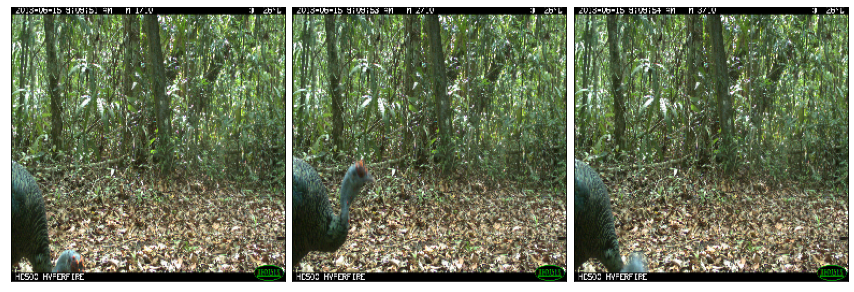

In [186]:
seqs = np.array(df_test_info["seq_id"].unique())
img_id = 12
imgs = np.array(df_test_info[df_test_info["seq_id"] == seqs[img_id]]["id"])
show = len(imgs)
fig = plt.figure(figsize=(15., (show/3) * 5.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(int(show/3), 3),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )
size = (256, 256)
for ax, image_path in zip(grid, imgs):
    # Iterating over the grid returns the Axes.
    image_path = os.path.join(DATASET, "test", image_path+".jpg")
    ax.get_yaxis().set_ticks([])
    ax.get_xaxis().set_ticks([])
    ax.imshow(cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB),size))

plt.show()

In [35]:
for i in df_test_info[:9]["id"]:
    print(i)
print(df_test_info[:11])

8b31d3be-21bc-11ea-a13a-137349068a90
8cf202be-21bc-11ea-a13a-137349068a90
8a87e62e-21bc-11ea-a13a-137349068a90
8e6994f4-21bc-11ea-a13a-137349068a90
948b29e2-21bc-11ea-a13a-137349068a90
8737aba8-21bc-11ea-a13a-137349068a90
918ca6a8-21bc-11ea-a13a-137349068a90
96d7ef64-21bc-11ea-a13a-137349068a90
90eac734-21bc-11ea-a13a-137349068a90
                                      id                                seq_id
0   8b31d3be-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
1   8cf202be-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
2   8a87e62e-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
3   8e6994f4-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
4   948b29e2-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
5   8737aba8-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
6   918ca6a8-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
7   96d7ef64-21bc-11ea-a13a-1373490

Take right join on the image id.

In [41]:
sub_tmp = sub_tmp.merge(df_test_info, left_on="Id", right_on="id", how="right")

In [63]:
sub_tmp.head(10)

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted559,Predicted562,Predicted563,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571
0,915879a0-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,91588116-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,9158a2f4-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9158aaa6-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9158f1a0-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,9159244a-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,91599f88-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,915a05ea-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,915a0cde-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,915a41b8-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Since there are multiple lines for the same sequence ID. We should aggregate them to single line. In this case, we will choose the image with the highest number of animals shown and submit the animal species and the number of animals shown in that image.

In [60]:
sum_counts = []
for i in tqdm(range(len(sub_tmp))):
    sum_counts.append(sum(sub_tmp.iloc[i][col_Predicted]))
print(sum_counts)

 47%|████████████████▉                   | 5187/11057 [00:06<00:07, 757.34it/s]


TypeError: unsupported operand type(s) for +: 'int' and 'str'

In [44]:
sub_tmp["total"] =  sum_counts
sub_tmp = sub_tmp.sort_values('total', ascending=False)
sub_tmp = sub_tmp[~sub_tmp.duplicated(keep='first', subset='seq_id')].fillna("0")

In [45]:
sub_tmp

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571,id,seq_id,total
59868,91937e92-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,91937e92-21bc-11ea-a13a-137349068a90,a917398e-0cd3-11eb-bed1-0242ac1c0002,6.0
14371,917d5b80-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,917d5b80-21bc-11ea-a13a-137349068a90,a925a870-0cd3-11eb-bed1-0242ac1c0002,4.0
20217,91764bb0-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,91764bb0-21bc-11ea-a13a-137349068a90,a925bec8-0cd3-11eb-bed1-0242ac1c0002,4.0
32018,9174204c-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,9174204c-21bc-11ea-a13a-137349068a90,a924d558-0cd3-11eb-bed1-0242ac1c0002,4.0
44759,91706fc4-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,91706fc4-21bc-11ea-a13a-137349068a90,a9190016-0cd3-11eb-bed1-0242ac1c0002,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60115,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,8c3b0424-21bc-11ea-a13a-137349068a90,9500e290-21bc-11ea-a13a-137349068a90,0
60148,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,8d2b546a-21bc-11ea-a13a-137349068a90,386634a2-6fe2-11eb-844f-0242ac1c0002,0
60158,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,902c630c-21bc-11ea-a13a-137349068a90,982a8f20-21bc-11ea-a13a-137349068a90,0
60167,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,867fbf02-21bc-11ea-a13a-137349068a90,92c82344-21bc-11ea-a13a-137349068a90,0


I'll match the result to the sample submission format. I was told that the order of the rows is not related to the score, but we will match it just in case.

In [46]:
# Since it was difficult to join the pandas series, I intentionally created an extra column.
sub = sub.reset_index()
sub = sub[["index", "Id"]].merge(sub_tmp, left_on="Id", right_on="seq_id")

In [47]:
sub = sub[["Id_x"] + col_Predicted].rename(columns={"Id_x": "Id"})

In [92]:
sub.to_csv("./sub_trackingv2.csv", index=False)
sub.head()

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted559,Predicted562,Predicted563,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571
0,32ce8026-7ec9-11eb-b675-4f3cc0c82eb3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,945c6602-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,a91c7e26-0cd3-11eb-bed1-0242ac1c0002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,9926239e-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,9672184c-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
